In [ ]:
# Packages
! pip install Keras
! pip install pandas
! pip install matplotlib
! pip install seaborn
! pip install tensorflow
! pip install sklearn
! pip install statannot
!pip install imbalanced-learn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Created wheel for sklearn: filename=sklearn-0.0-py2.py3-none-any.whl size=1310 sha256=024ab8aee0bf247f0ae33c894c305fded79488bcc343d2daba9ac5e720695067
  Stored in directory: /root/.cache/pip/wheels/46/ef/c3/157e41f5ee1372d1be90b09f74f82b10e391eaacca8f22d33e
Successfully built sklearn
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: 

In [ ]:
# Import libaries
import pandas as pd
from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasClassifier
from keras.utils import np_utils
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

In [ ]:
# File access (run only if on colab)
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Modular functions
# workflow: imports data, formats for ML fitting (i.e. one hot encoding)
# .. and trains data

# confusion_matrices: plots confusion matrices for each data combination
# .. so far: top row = dna-meth, bottom row = gene-exp
# .......... first col = unbalanced data, second col = oversampled, third = undersampled

# precision_recall_displays: plots all data combinations on precision-recall plot

# Data Splits
from sklearn.model_selection import train_test_split

# SVM models
from sklearn import svm

# Uses imbalanced-learn
import imblearn
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler

# Confusion matrices
from sklearn.metrics import ConfusionMatrixDisplay

# Precision Recall Plots
from sklearn.metrics import PrecisionRecallDisplay

def workflow(dna_meth, gene_exp, svm_type='Linear'):
    """ Runs the data importing, linear SVM training for all sampling procedures
    (unbalanced/untouched, oversampling and undersampling) for both gene expression
    and dna methylation data sets.

    args:
      dna_meth: pandas Dataframe of preprocessed dna methylation data.
      gene_exp: pandas Dataframe of preprocessed gene expression data.

    returns:
      tuple: [data, models]

        data[t][i]: dict of dicts storing the train_test_splits for each
          combination, where t is dna_meth or gene_exp, and i is the sampling procedure.

        models[t][i]: dict of dicts storing the linear SVM model instance for each
          combination, where t is dna_meth or gene_exp, and i is the sampling procedure.

    Coded by RT.
    """
    dna_meth_data = dna_meth
    gene_exp_data = gene_exp

    dna_meth_data.set_index('Patient', inplace=True)
    gene_exp_data.set_index('Patient', inplace=True)

    # Var list
    probe_list = [x for x in list(dna_meth_data.columns) if x != 'Label']
    gene_list = [x for x in list(gene_exp_data.columns) if x != 'Label']

    # Oversampler. Minority indicates that the normal samples (minority) will be increased to match tumor samples.
    oversample = RandomOverSampler(sampling_strategy='minority')
    # Undersampler. Majority indicates the random data from tumor class will be removed, until matching the number of normal classes.
    undersample = RandomUnderSampler(sampling_strategy='majority')

    # Model storages
    data = dict() # {dna:{unbalanced,oversampled,undersampled}, gene:{etc}}
    models = dict()

    # DNA-meth vs Gene-exp Loop
    for t in ['dna_meth', 'gene_exp']:
      if t == 'dna_meth':
        X = dna_meth_data[probe_list]
        y = pd.get_dummies(dna_meth_data['Label'])['Primary Tumor'] #Primary tumor = 1, Normal = 0
      elif t == 'gene_exp':
        X = gene_exp_data[gene_list]
        y = pd.get_dummies(gene_exp_data['Label'])['Primary Tumor'] #Primary tumor = 1, Normal = 0

      data[t] = dict() #{dna: {}, gene: {}}
      models[t] = dict() #{dna: {}, gene: {}}

      # Sampling and Training Loop (within DNA-Genexp loop)
      for i in ['unbalanced', 'oversampled', 'undersampled']:
        if i == 'unbalanced': #Stratify 0.3
          X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.3)
          # What SVM type? Supported: Linear and non-linear using an RBF kernel
          if svm_type == 'Linear':
            clf = svm.LinearSVC()
          elif svm_type == 'rbf':
            clf = svm.SVC()
          clf.fit(X_train, y_train)

        elif i == 'oversampled':
          X_over, y_over = oversample.fit_resample(X, y)
          X_train, X_test, y_train, y_test = train_test_split(X_over, y_over, test_size=0.3)
          # What SVM type? Supported: Linear and non-linear using an RBF kernel
          if svm_type == 'Linear':
            clf = svm.LinearSVC()
          elif svm_type == 'rbf':
            clf = svm.SVC()
          clf.fit(X_train, y_train)

        elif i == 'undersampled':
          X_under, y_under = undersample.fit_resample(X, y)
          X_train, X_test, y_train, y_test = train_test_split(X_over, y_over, test_size=0.3)
          # What SVM type? Supported: Linear and non-linear using an RBF kernel
          if svm_type == 'Linear':
            clf = svm.LinearSVC()
          elif svm_type == 'rbf':
            clf = svm.SVC()
          clf.fit(X_train, y_train)

        data[t][i] = [X_train, X_test, y_train, y_test] #{dna_meth:{unbalanced:[x,..]}}
        models[t][i] = clf
    return data, models


def confusion_matrices(data, models):
  """ Using the tuple storage for data, models from the workflow function, plots
  all the confusion matrices for all combinations.

  args:
    data = data dict of dicts from workflow. Should be the first item from the
      output tuple from workflow.
    models = models dict of dicts from workflow. Should be the second item from the
      output tuple from workflow.

  returns:
    None, but shows Matplotlib inline subplot.

  Coded by RT.
  """
  # unpack
  data = data
  models = models
  # Model assessment
  # 6 figures
  fig, ax = plt.subplots(2, 3, dpi=1500, constrained_layout = True)
  ax = ax.flatten()
  axix = 0

  # Figure loop
  for t in ['dna_meth', 'gene_exp']:
    for i in ['unbalanced', 'oversampled', 'undersampled']:
      clf = models[t][i]
      X_train, X_test, y_train, y_test = data[t][i]
      ConfusionMatrixDisplay.from_estimator(clf, X_test, y_test, ax=ax[axix]) #evaluate SVM using unseen data
      #plot_confusion_matrix(clf, pd.concat([X_train,X_test]), pd.concat([y_train,y_test])) #evaluate SVM on data
      axix += 1

def precision_recall_displays(data, models):
  """ Using the tuple storage for data, models from the workflow function, plots
  all the precision recall plots for each combination in one axis.

  args:
    data = data dict of dicts from workflow. Should be the first item from the
      output tuple from workflow.
    models = models dict of dicts from workflow. Should be the second item from the
      output tuple from workflow.

  returns:
    None, but shows Matplotlib inline subplot.

  Coded by RT.
  """
  # unpack
  data = data
  models = models

  plt.figure(figsize=(12,8))
  # Model assessment
  # Figure loop
  for t in ['dna_meth', 'gene_exp']:
    for i in ['unbalanced', 'oversampled', 'undersampled']:
      clf = models[t][i]
      X_train, X_test, y_train, y_test = data[t][i]
      PrecisionRecallDisplay.from_estimator(clf, X_test, y_test, ax=plt.gca(), name=f'Linear SVM on {i} {t}') #evaluate SVM using unseen data

In [ ]:
# Usage example

# Define the path to your data (should be a pandas DataFrame)
path_dna = '/content/drive/My Drive/BINF7000/dna_meth_5probes.csv'
path_gene = '/content/drive/My Drive/BINF7000/gene_exp_log2_5genes.csv'

# Load it into these variable names
dna_meth_data = pd.read_csv(path_dna)
gene_exp_data = pd.read_csv(path_gene)

# Unpack data, models from the output of the workflow function (loads, trains and stores the data and SVM linear model instances)
data, models = workflow(dna_meth=dna_meth_data, gene_exp=gene_exp_data)

/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


In [ ]:
# Confusion matrices
confusion_matrices(data, models)

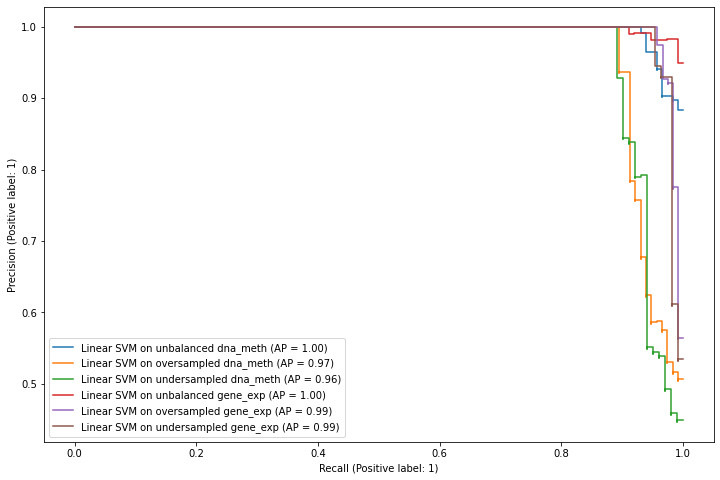

In [ ]:
# Precision-Recall plots for all models
precision_recall_displays(data, models)

In [ ]:
# data['dna_meth']['unbalanced']
def data_reconstructed(which_method, which_sampling, data):
  """ Probably not necessary, but reconstructs the original dataframe for each
  data combination. Simply concatenates the train_test_splits.

  args:
    which_method: "dna_meth" or "gene_exp"
    which_sampling: "unbalanced", "oversampled", "undersampled"
    data: data dict of dicts from workflow function

  returns:
    df: pandas Dataframe

  Coded by RT.
  """
  if which_method in ['gene_exp', 'dna_meth']:
    method = which_method
  else:
    raise ValueError(
      'Not a valid method/sampling name. Methods = ["gene_exp", "dna_meth"].')

  if which_sampling in ['unbalanced','oversampled','undersampled']:
    sampling = which_sampling
  else:
    raise ValueError(
      'Not a valid method/sampling name. Sampling = ["unbalanced", "oversampled", "undersampled"]'
      )

  data_list_select = data[method][sampling]

  X_train = data_list_select[0]
  X_test = data_list_select[1]
  y_train = data_list_select[2]
  y_test = data_list_select[3]

  Xs = pd.concat([X_train, X_test])
  ys = pd.concat([y_train, y_test])
  df = Xs.merge(ys, on=Xs.index).set_index('key_0')
  df.index.names = ['Patient']
  return df

In [ ]:
def get_recall(which_method, which_sampling, data, models):
  """ For a given data combination, gets the recall using the respective linear
  SVM model instance, and test data set.

  args:
    which_method: "dna_meth" or "gene_exp"
    which_sampling: "unbalanced", "oversampled", "undersampled"
    data: data dict of dicts from workflow function
    models: model dict of dicts from workflow function

  returns:
    recall_score(float): Recall score calculated using a given SVM model,
      y_test, and X_test.

  Coded by RT.
  """
  if which_method in ['gene_exp', 'dna_meth']:
    method = which_method
  else:
    raise ValueError(
      'Not a valid method/sampling name. Methods = ["gene_exp", "dna_meth"].')

  if which_sampling in ['unbalanced','oversampled','undersampled']:
    sampling = which_sampling
  else:
    raise ValueError(
      'Not a valid method/sampling name. Sampling = ["unbalanced", "oversampled", "undersampled"]'
      )

  data_list_select = data[method][sampling]
  clf = models[method][sampling]

  from sklearn.metrics import recall_score
  y_true = data_list_select[3]
  y_pred = clf.predict(data_list_select[1])

  return recall_score(y_true, y_pred, average='macro')

In [ ]:
get_recall('gene_exp', 'unbalanced', data=data, models=models)

0.906547619047619

In [ ]:
get_recall('gene_exp', 'oversampled', data=data, models=models)

0.9703389830508475

In [ ]:
get_recall('gene_exp', 'undersampled', data=data, models=models)

0.9768518518518519

In [ ]:
get_recall('dna_meth', 'unbalanced', data=data, models=models)

0.9649122807017544

In [ ]:
get_recall('dna_meth', 'oversampled', data=data, models=models)

0.9429824561403508

In [ ]:
get_recall('dna_meth', 'undersampled', data=data, models=models)

0.9356435643564356

In [ ]:
# Usage example for multiple dna and gene exp path files
# Iterate for 1 to 10 probes (or genes):
var_gene = dict()
var_meth = dict()
var_models = dict()
var_data = dict()

# Train models for every combination. Coded by RT.
for sampling in ['unbalanced', 'oversampled', 'undersampled']:
  var_gene[sampling] = dict()
  var_meth[sampling] = dict()

  for var_num in (1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 15, 20, 50):
    path_dna = f'/content/drive/My Drive/BINF7000/A2 Group Assignment Data/v2_log2rpkmminmaxed/dna_meth_{var_num}probes.csv'
    path_gene = f'/content/drive/My Drive/BINF7000/A2 Group Assignment Data/v2_log2rpkmminmaxed/gene_exp_norm_col_log2_{var_num}genes.csv'

    # Load it into these variable names
    dna_meth_data = pd.read_csv(path_dna)
    gene_exp_data = pd.read_csv(path_gene)

    # Unpack data, models from the output of the workflow function (loads, trains and stores the data and SVM linear model instances)
    data, models = workflow(dna_meth=dna_meth_data, gene_exp=gene_exp_data)

    var_gene[sampling][var_num] = get_recall("gene_exp", sampling, data=data, models=models)
    var_meth[sampling][var_num] = get_recall("dna_meth", sampling, data=data, models=models)
    var_models[var_num] = models
    var_data[var_num] = data

In [ ]:
for ms in var_models:
  model = var_models[ms]
  data = var_data[ms]
  # get_recall(whichmeth,whichsampling,data,models)
  # confusion_matrices(data, model)

In [ ]:
for ms in var_models:
  model = var_models[ms]
  data = var_data[ms]
  print(f'Var no: {ms}')
  confusion_matrices(data, model)

Var no: 1
Var no: 2
Var no: 3
Var no: 4
Var no: 5
Var no: 6
Var no: 7
Var no: 8
Var no: 9
Var no: 10
Var no: 15
Var no: 20
Var no: 50


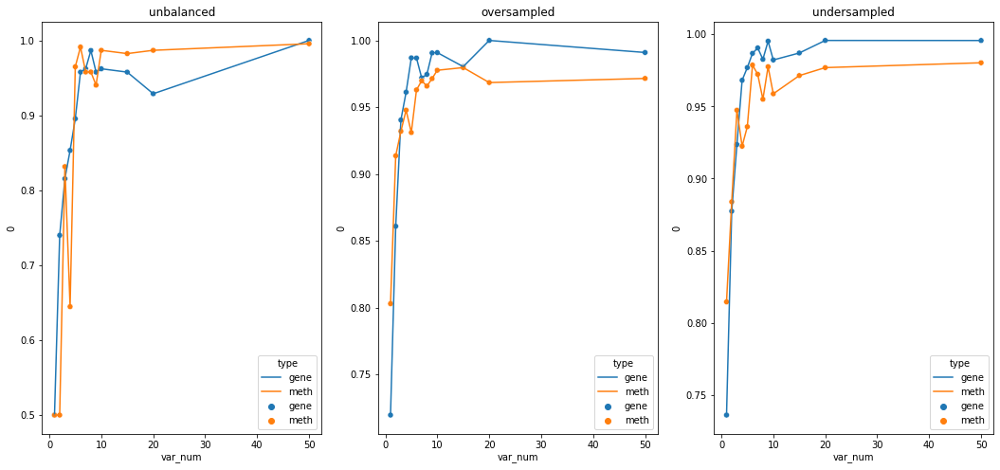

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(18, 8))

axix = 0
for sampling in ['unbalanced', 'oversampled', 'undersampled']:
    # Let's get the recalls for various nums for unbalanced data

  gene_recalls = pd.DataFrame.from_dict(var_gene[sampling], orient='index')
  gene_recalls['var_num'] = list(gene_recalls.index)
  gene_recalls['type'] = 'gene'

  meth_recalls = pd.DataFrame.from_dict(var_meth[sampling], orient='index')
  meth_recalls['var_num'] = list(meth_recalls.index)
  meth_recalls['type'] = 'meth'

  merged_recalls = pd.concat([gene_recalls, meth_recalls]).reset_index()

  sns.scatterplot(data=merged_recalls, x='var_num', y=0, hue='type', ax=ax[axix]).set_title(sampling)
  sns.lineplot(data=merged_recalls, x='var_num', y=0, hue='type', ax=ax[axix])

  axix += 1

In [ ]:
# Remove undersampled -> Removing data, losing representation. Also remmoving the variation in tumor. Want to capture more of the general trend.
# Lose capturing the variation in tumor samples, more prone to overfitting -> Have a less general model

In [ ]:
# Remove unbalanced -> fewer normals examples -> harder to predict true negatives

In [ ]:
# Oversampling -> Extrapolate the trend of normal samples 5 fold -> Bad generalisability for different populations of normal samples
# But we saw an obvious trend from EDA, so possibly extrapolatable. But still consider the above a limitation.

# Test the Models

Import the mystery data and perform the normalisations (on gene exp only)

In [ ]:
unseen_meth = pd.read_csv('/content/drive/My Drive/BINF7000/mystery_dna-meth.csv')
unseen_gene = pd.read_csv('/content/drive/My Drive/BINF7000/mystery_gene-expr.csv')

In [ ]:
# Impute Nas as 0s
unseen_meth = unseen_meth.fillna(0)
unseen_gene = unseen_gene.fillna(0)

In [ ]:
# Rename patient col
unseen_meth.rename(columns={'Unnamed: 0':'Patient'}, inplace=True)
unseen_gene.rename(columns={'Unnamed: 0':'Patient'}, inplace=True)

# Set patients as index
unseen_meth.set_index('Patient', inplace=True)
unseen_gene.set_index('Patient', inplace=True)

In [ ]:
# Subset on our selected variables
original_dna_meth = data_reconstructed('dna_meth', 'oversampled', data)
probes = list(original_dna_meth.columns[:-1])

original_gene_expr = data_reconstructed('gene_exp', 'oversampled', data)
genes = list(original_gene_expr.columns[:-1])

In [ ]:
# Normalise the unseen gene expression data the same way we normalised the training gene expression data
# Min-Max scale the Log2(RPKM)
normalised_unseen_genes = np.log2(unseen_gene[genes] + 1) #Log2 trans
min_maxed = normalised_unseen_genes.copy()
for cols in min_maxed.columns: # Min-Max Scaling
    if cols != 'Label':
      col_max = min_maxed[cols].max()
      col_min = min_maxed[cols].min()

      #if col_max == 0: # If the column max is 0. i.e. All of it is 0, drop it.
      #    min_maxed.drop(cols, axis=1)
      #else:
      min_maxed[cols] = (min_maxed[cols] - col_min)/(col_max - col_min) #norm each col.

# Assess the models (variable number 1 to 10?) on mystery data set

In [ ]:
# Here you can access the models as such
# Model for 6 variables = model[6]
# Then select which measurement method. i.e. for dna_meth, model[6]['dna_meth']
# Then select which sampling method. i.e. for oversampled, model[6]['dna_meth]['oversampled']

In [ ]:
# Here we have the starting preprocessed mystery data, with ALL probes/genes
#unseen_gene
#unseen_meth

Text(0.5, 0, 'Number of Gene/Probes')

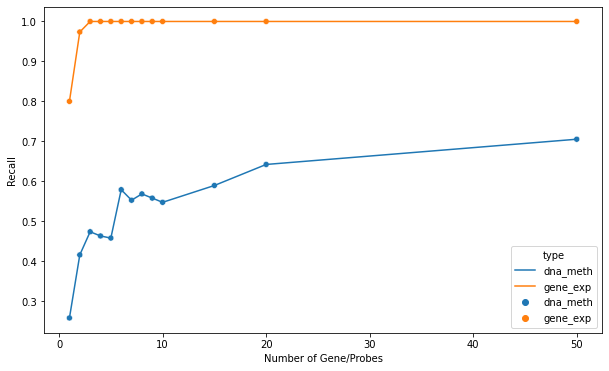

In [ ]:
from sklearn.metrics import recall_score

# Variable number loop. Coded by RT.
axix = 0
for var_type in ['dna_meth', 'gene_exp']:
  var_dict = dict() # reset once done with other
  #for var_num in range(1, 11): # 1 to 10
  for var_num in (1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 15, 20, 50): #1 to 10, 15/20/50

    path_dna = f'/content/drive/My Drive/BINF7000/A2 Group Assignment Data/v2_log2rpkmminmaxed/dna_meth_{var_num}probes.csv'
    path_gene = f'/content/drive/My Drive/BINF7000/A2 Group Assignment Data/v2_log2rpkmminmaxed/gene_exp_norm_col_log2_{var_num}genes.csv'

    # Load it into these variable names
    dna_meth_data = pd.read_csv(path_dna)
    gene_exp_data = pd.read_csv(path_gene)

    dna_meth_data.set_index('Patient', inplace=True)
    gene_exp_data.set_index('Patient', inplace=True)

    probe_list = [x for x in list(dna_meth_data.columns) if x != 'Label']
    gene_list = [x for x in list(gene_exp_data.columns) if x != 'Label']

    model_instance = var_models[var_num][var_type]['oversampled']

    if var_type == 'dna_meth':
      unseen_dna_data = unseen_meth[probe_list]
      unseen_dna_labels = unseen_meth['Label']
      unseen_dna_labels = pd.get_dummies(unseen_dna_labels)['Primary Tumor'] # one-hot encode
      var_dict[var_num] = recall_score(unseen_dna_labels, model_instance.predict(unseen_dna_data))

    elif var_type == 'gene_exp':
      unseen_gene_data = unseen_gene[gene_list]
      unseen_gene_labels = unseen_gene['Label']
      unseen_gene_labels = pd.get_dummies(unseen_gene_labels)['Primary Tumor']
      var_dict[var_num] = recall_score(unseen_gene_labels, model_instance.predict(unseen_gene_data))


  if axix == 0:
    current_recalls = pd.DataFrame.from_dict(var_dict, orient='index')
    current_recalls['var_num'] = list(current_recalls.index)
    current_recalls['type'] = var_type

  elif axix == 1:
    final_recalls = pd.DataFrame.from_dict(var_dict, orient='index')
    final_recalls['var_num'] = list(current_recalls.index)
    final_recalls['type'] = var_type

  axix += 1

merged_recalls = pd.concat([current_recalls, final_recalls]).reset_index()

# Plot
plt.figure(figsize=(10,6))
g1 = sns.scatterplot(data=merged_recalls, x='var_num', y=0, hue='type', ax=plt.gca())
g2 = sns.lineplot(data=merged_recalls, x='var_num', y=0, hue='type', ax=plt.gca())
g1.set_ylabel('Recall')
g1.set_xlabel('Number of Gene/Probes')

Text(0.5, 0, 'Number of Gene/Probes')

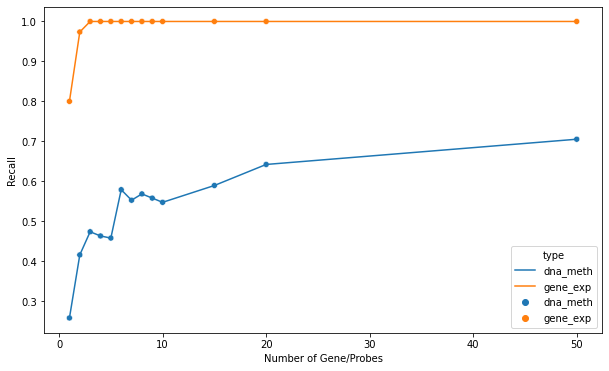

In [ ]:
from sklearn.metrics import recall_score

# Variable number loop. Coded by RT.
axix = 0
for var_type in ['dna_meth', 'gene_exp']:
  var_dict = dict() # reset once done with other
  #for var_num in range(1, 11): # 1 to 10
  for var_num in (1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 15, 20, 50): #1 to 10, 15/20/50

    path_dna = f'/content/drive/My Drive/BINF7000/A2 Group Assignment Data/v2_log2rpkmminmaxed/dna_meth_{var_num}probes.csv'
    path_gene = f'/content/drive/My Drive/BINF7000/A2 Group Assignment Data/v2_log2rpkmminmaxed/gene_exp_norm_col_log2_{var_num}genes.csv'

    # Load it into these variable names
    dna_meth_data = pd.read_csv(path_dna)
    gene_exp_data = pd.read_csv(path_gene)

    dna_meth_data.set_index('Patient', inplace=True)
    gene_exp_data.set_index('Patient', inplace=True)

    probe_list = [x for x in list(dna_meth_data.columns) if x != 'Label']
    gene_list = [x for x in list(gene_exp_data.columns) if x != 'Label']

    model_instance = var_models[var_num][var_type]['oversampled']

    if var_type == 'dna_meth':
      unseen_dna_data = unseen_meth[probe_list]
      unseen_dna_labels = unseen_meth['Label']
      unseen_dna_labels = pd.get_dummies(unseen_dna_labels)['Primary Tumor'] # one-hot encode
      var_dict[var_num] = recall_score(unseen_dna_labels, model_instance.predict(unseen_dna_data))

    elif var_type == 'gene_exp':
      unseen_gene_data = unseen_gene[gene_list]
      unseen_gene_labels = unseen_gene['Label']
      unseen_gene_labels = pd.get_dummies(unseen_gene_labels)['Primary Tumor']
      var_dict[var_num] = recall_score(unseen_gene_labels, model_instance.predict(unseen_gene_data))


  if axix == 0:
    current_recalls = pd.DataFrame.from_dict(var_dict, orient='index')
    current_recalls['var_num'] = list(current_recalls.index)
    current_recalls['type'] = var_type

  elif axix == 1:
    final_recalls = pd.DataFrame.from_dict(var_dict, orient='index')
    final_recalls['var_num'] = list(current_recalls.index)
    final_recalls['type'] = var_type

  axix += 1

merged_recalls = pd.concat([current_recalls, final_recalls]).reset_index()

# Plot
plt.figure(figsize=(10,6))
g1 = sns.scatterplot(data=merged_recalls, x='var_num', y=0, hue='type', ax=plt.gca())
g2 = sns.lineplot(data=merged_recalls, x='var_num', y=0, hue='type', ax=plt.gca())
g1.set_ylabel('Recall')
g1.set_xlabel('Number of Gene/Probes')

In [ ]:
var_models.keys()

dict_keys([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 15, 20, 50])

In [ ]:
var_data.keys()

dict_keys([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 15, 20, 50])

In [ ]:
len(var_data[1]['dna_meth']['oversampled'])

4

Text(0.5, 0, 'Number of Gene/Probes')

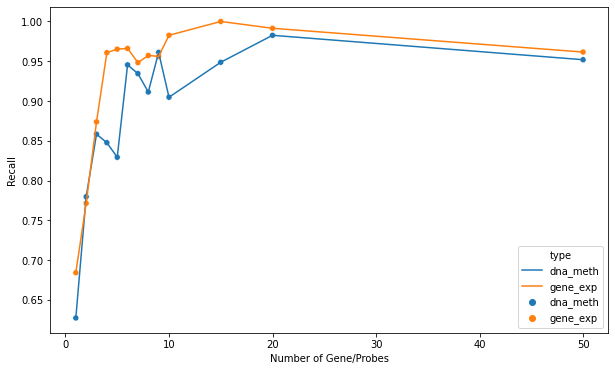

In [ ]:
# Plot for the test dataset (from traintestsplit)

#from sklearn.metrics import precision_recall_fscore_support
axix = 0
for var_type in ['dna_meth', 'gene_exp']:
  var_dict = dict() # reset once done with other
  for var_num in (1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 15, 20, 50):
    model_instance = var_models[var_num][var_type]['oversampled']
    data_instance = var_data[var_num][var_type]['oversampled']
    _, X_test, _, y_test = data_instance

    if var_type == 'dna_meth':
      var_dict[var_num] = recall_score(y_test, model_instance.predict(X_test))
    elif var_type == 'gene_exp':
      var_dict[var_num] = recall_score(y_test, model_instance.predict(X_test))

  if axix == 0:
    current_recalls = pd.DataFrame.from_dict(var_dict, orient='index')
    current_recalls['var_num'] = list(current_recalls.index)
    current_recalls['type'] = var_type

  elif axix == 1:
    final_recalls = pd.DataFrame.from_dict(var_dict, orient='index')
    final_recalls['var_num'] = list(current_recalls.index)
    final_recalls['type'] = var_type

  axix += 1

merged_recalls = pd.concat([current_recalls, final_recalls]).reset_index()

# Plot
plt.figure(figsize=(10,6))
g1 = sns.scatterplot(data=merged_recalls, x='var_num', y=0, hue='type', ax=plt.gca())
g2 = sns.lineplot(data=merged_recalls, x='var_num', y=0, hue='type', ax=plt.gca())
g1.set_ylabel('Recall')
g1.set_xlabel('Number of Gene/Probes')

Text(0.5, 0, 'Number of Gene/Probes')

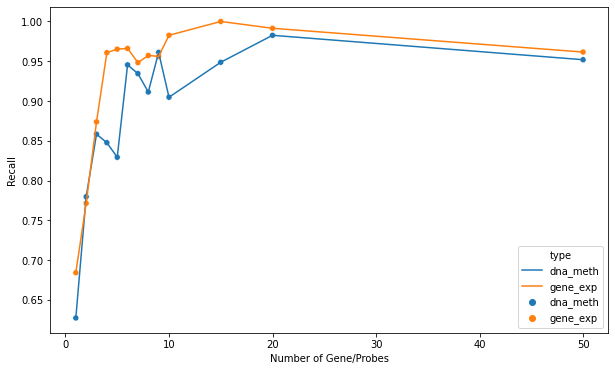

In [ ]:
# Plot for the mystery dataset (from traintestsplit),
from sklearn.metrics import accuracy_score, precision_score, recall_score
# Mystery or Test set
mystery = False
#from sklearn.metrics import precision_recall_fscore_support
axix = 0
for var_type in ['dna_meth', 'gene_exp']:
  recall_dict = dict() # reset once done with other
  accuracy_dict = dict()
  precision_dict = dict()
  for var_num in (1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 15, 20, 50):

    path_dna = f'/content/drive/My Drive/BINF7000/A2 Group Assignment Data/v2_log2rpkmminmaxed/dna_meth_{var_num}probes.csv'
    path_gene = f'/content/drive/My Drive/BINF7000/A2 Group Assignment Data/v2_log2rpkmminmaxed/gene_exp_norm_col_log2_{var_num}genes.csv'

    # Load it into these variable names
    dna_meth_data = pd.read_csv(path_dna)
    gene_exp_data = pd.read_csv(path_gene)

    dna_meth_data.set_index('Patient', inplace=True)
    gene_exp_data.set_index('Patient', inplace=True)

    probe_list = [x for x in list(dna_meth_data.columns) if x != 'Label']
    gene_list = [x for x in list(gene_exp_data.columns) if x != 'Label']

    model_instance = var_models[var_num][var_type]['oversampled']
    data_instance = var_data[var_num][var_type]['oversampled']
    _, X_test, _, y_test = data_instance

    # Scores
    if var_type == 'dna_meth':
      unseen_dna_data = unseen_meth[probe_list]
      unseen_dna_labels = unseen_meth['Label']
      unseen_dna_labels = pd.get_dummies(unseen_dna_labels)['Primary Tumor'] # one-hot encode

      if mystery:
        prior = unseen_dna_labels
        prior_data = unseen_dna_data
      else:
        prior = y_test
        prior_data = X_test

      recall_dict[var_num] = recall_score(prior, model_instance.predict(prior_data))
      accuracy_dict[var_num] = accuracy_score(prior, model_instance.predict(prior_data))
      precision_dict[var_num] = precision_score(prior, model_instance.predict(prior_data))


    elif var_type == 'gene_exp':
      unseen_gene_data = unseen_gene[gene_list]
      unseen_gene_labels = unseen_gene['Label']
      unseen_gene_labels = pd.get_dummies(unseen_gene_labels)['Primary Tumor']

      if mystery:
        prior = unseen_gene_labels
        prior_data = unseen_gene_data
      else:
        prior = y_test
        prior_data = X_test

      recall_dict[var_num] = recall_score(prior, model_instance.predict(prior_data))
      accuracy_dict[var_num] = accuracy_score(prior, model_instance.predict(prior_data))
      precision_dict[var_num] = precision_score(prior, model_instance.predict(prior_data))

  if axix == 0:
    current_recalls = pd.DataFrame.from_dict(recall_dict, orient='index')
    current_recalls['var_num'] = list(current_recalls.index)
    current_recalls['type'] = var_type

    current_accuracy = pd.DataFrame.from_dict(accuracy_dict, orient='index')
    current_accuracy['var_num'] = list(current_accuracy.index)
    current_accuracy['type'] = var_type

    current_precision = pd.DataFrame.from_dict(precision_dict, orient='index')
    current_precision['var_num'] = list(current_precision.index)
    current_precision['type'] = var_type

  elif axix == 1:
    final_recalls = pd.DataFrame.from_dict(recall_dict, orient='index')
    final_recalls['var_num'] = list(current_recalls.index)
    final_recalls['type'] = var_type

    final_accuracy = pd.DataFrame.from_dict(accuracy_dict, orient='index')
    final_accuracy['var_num'] = list(current_accuracy.index)
    final_accuracy['type'] = var_type

    final_precision = pd.DataFrame.from_dict(precision_dict, orient='index')
    final_precision['var_num'] = list(current_precision.index)
    final_precision['type'] = var_type

  axix += 1

merged_recalls = pd.concat([current_recalls, final_recalls]).reset_index()
merged_accuracy = pd.concat([current_accuracy, final_accuracy]).reset_index()
merged_precision = pd.concat([current_precision, final_precision]).reset_index()

# Recall Plot
plt.figure(figsize=(10,6))
g1 = sns.scatterplot(data=merged_recalls, x='var_num', y=0, hue='type', ax=plt.gca())
g2 = sns.lineplot(data=merged_recalls, x='var_num', y=0, hue='type', ax=plt.gca())
g1.set_ylabel('Recall')
g1.set_xlabel('Number of Gene/Probes')

Text(0.5, 0, 'Number of Gene/Probes')

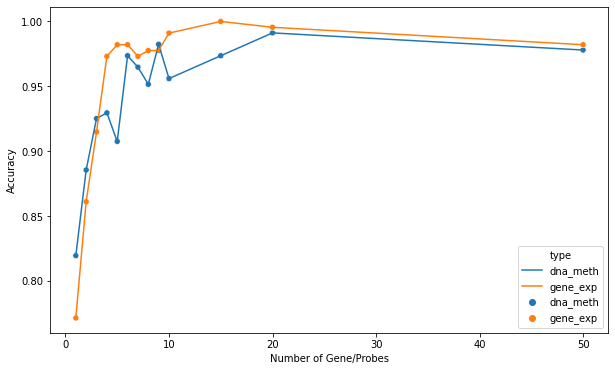

In [ ]:
# Accuracy Plot
plt.figure(figsize=(10,6))
g1 = sns.scatterplot(data=merged_accuracy, x='var_num', y=0, hue='type', ax=plt.gca())
g2 = sns.lineplot(data=merged_accuracy, x='var_num', y=0, hue='type', ax=plt.gca())
g1.set_ylabel('Accuracy')
g1.set_xlabel('Number of Gene/Probes')

Text(0.5, 0, 'Number of Gene/Probes')

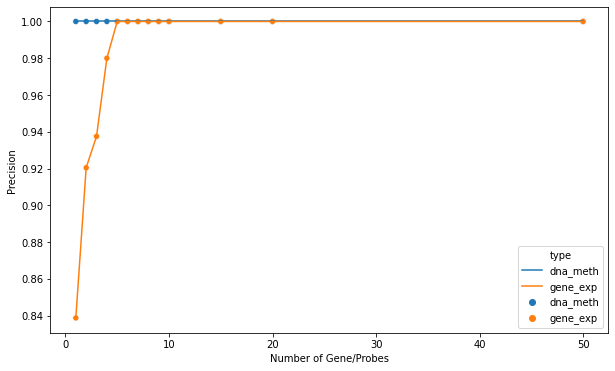

In [ ]:
# Precision Plot
plt.figure(figsize=(10,6))
g1 = sns.scatterplot(data=merged_precision, x='var_num', y=0, hue='type', ax=plt.gca())
g2 = sns.lineplot(data=merged_precision, x='var_num', y=0, hue='type', ax=plt.gca())
g1.set_ylabel('Precision')
g1.set_xlabel('Number of Gene/Probes')

In [ ]:
# Data of mystery
#merged_recalls
#merged_accuracy
#merged_precision

In [ ]:
# Recall saved
for types in ('dna_meth', 'gene_exp'):
  merged_recalls[merged_recalls['type'] == types][[0, 'var_num']].rename(columns={0:'Recall'}).to_csv(f'{types}_recalls_TESTSET.csv')
  merged_accuracy[merged_accuracy['type'] == types][[0, 'var_num']].rename(columns={0:'Accuracy'}).to_csv(f'{types}_accuracy_TESTSET.csv')
  merged_precision[merged_precision['type'] == types][[0, 'var_num']].rename(columns={0:'Precision'}).to_csv(f'{types}_precision_TESTSET.csv')

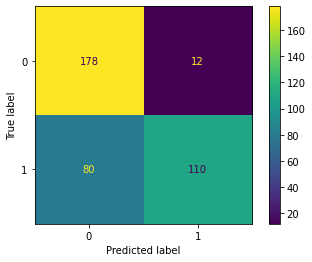

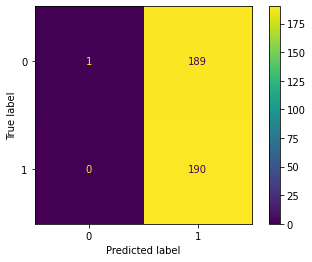

In [ ]:
# Confusion matrices, again.
from sklearn.metrics import confusion_matrix

# Load model params; FOR 6 GENES/PROBES
var_num = 6
path_dna = f'/content/drive/My Drive/BINF7000/A2 Group Assignment Data/v2_log2rpkmminmaxed/dna_meth_{var_num}probes.csv'
path_gene = f'/content/drive/My Drive/BINF7000/A2 Group Assignment Data/v2_log2rpkmminmaxed/gene_exp_norm_col_log2_{var_num}genes.csv'

dna_meth_data = pd.read_csv(path_dna)
gene_exp_data = pd.read_csv(path_gene)

dna_meth_data.set_index('Patient', inplace=True)
gene_exp_data.set_index('Patient', inplace=True)

probe_list = [x for x in list(dna_meth_data.columns) if x != 'Label']
gene_list = [x for x in list(gene_exp_data.columns) if x != 'Label']

unseen_dna_data = unseen_meth[probe_list]
unseen_dna_labels = unseen_meth['Label']
unseen_dna_labels = pd.get_dummies(unseen_dna_labels)['Primary Tumor'] # one-hot encode

unseen_gene_data = unseen_gene[gene_list]
unseen_gene_labels = unseen_gene['Label']
unseen_gene_labels = pd.get_dummies(unseen_gene_labels)['Primary Tumor']

# Use model 6
dna_model_instance = var_models[6]['dna_meth']['oversampled']
gene_model_instance = var_models[6]['gene_exp']['oversampled']

# Plot confusion matrix
# On 6 probes model
ConfusionMatrixDisplay.from_estimator(dna_model_instance, X=unseen_dna_data, y=unseen_dna_labels)

# On 6 genes model
ConfusionMatrixDisplay.from_estimator(gene_model_instance, X=unseen_gene_data, y=unseen_gene_labels)